In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from optuna.integration import lightgbm as oplgb
import lightgbm as lgb
from sklearn.model_selection import train_test_split,KFold
from sklearn.metrics import mean_squared_error
from optuna.samplers import TPESampler
import japanize_matplotlib

# ESGファンド検索

In [2]:
Data = pd.read_csv(r"運用方針.csv",engine='python',encoding="cp932")

In [3]:
original = pd.read_csv(r"Dataset.csv",index_col=0,encoding="cp932")

## 検索キーワード設定

ESGファンド選定基準はファンドの運用方針にESG関連語が含まれているかどうか\
なお、今回採用したESG関連語は以下の通り\
ESG関連語 : ESG, SDGs, CSR, ＥＳＧ, ＳＤＧｓ, ＣＳＲ, 持続可能, 再生可能エネルギー, 女性活躍, 社会的課題, 環境問題

In [4]:
# 検索キーワードの変更はここで行う
keywords = 'ESG|SDGs|CSR|ＥＳＧ|ＳＤＧｓ|ＣＳＲ|持続可能|再生可能エネルギー|女性活躍|社会的課題|環境問題'

target = Data[Data['Document'].str.contains(keywords)]
target

,Unnamed: 0,FundName,Document
204,0131218A,野村ＡＣＩ先進医療インパクト投資Ａコース為替ヘッジあり資産成長型,マザーファンドへの投資を通じて、世界各国（新興国を含みます）の先進医療関連企業の株式（ＤＲ（...
210,01312202,モルガン・スタンレーグローバル・サステイン戦略ファンド（為替ヘッジあり）,マザーファンドへの投資を通じて、世界各国（新興国を含みます）の株式（ＤＲ（預託証券）を含みま...
275,01313187,野村日本最高益更新企業ファンド（自己ベスト）,わが国の株式を主要投資対象とし、信託財産の成長を目標に積極的な運用を行なうことを基本とします...
276,0131318A,野村ＡＣＩ先進医療インパクト投資Ｂコース為替ヘッジなし資産成長型,マザーファンドへの投資を通じて、世界各国（新興国を含みます）の先進医療関連企業の株式（ＤＲ（...
281,01313202,モルガン・スタンレーグローバル・サステイン戦略ファンド（為替ヘッジなし）,マザーファンドへの投資を通じて、世界各国（新興国を含みます）の株式（ＤＲ（預託証券）を含みま...
337,0131418A,野村ＡＣＩ先進医療インパクト投資Ｃコース為替ヘッジあり予想分配金提示型,マザーファンドへの投資を通じて、世界各国（新興国を含みます）の先進医療関連企業の株式（ＤＲ（...
380,0131518A,野村ＡＣＩ先進医療インパクト投資Ｄコース為替ヘッジなし予想分配金提示型,マザーファンドへの投資を通じて、世界各国（新興国を含みます）の先進医療関連企業の株式（ＤＲ（...
633,02311998,日興エコファンド,マザーファンドへの投資を通じて、わが国の株式の中でも環境問題への対応が優れた企業および環境に...
792,0231R01A,年金積立エコファンド（ＤＣエコファンド）,マザーファンドへの投資を通じて、わが国の株式の中でも環境問題への対応が優れた企業および環境に...
793,03311001,エコ・パートナーズ（みどりの翼）,わが国の金融商品取引所に上場されている株式および店頭登録株式に投資することにより、信託財産の...


In [5]:
target_r = target.iloc[:,0].reset_index(drop=True)

### 注意) この段階では外株や内債等が含まれる

In [6]:
target_data = pd.DataFrame()

for i in target_r.values:
    for j in range(len(original)):
        if original.iloc[j,0] == i :
            target_data =pd.concat([target_data,original.iloc[j,:]],axis=1,sort=False)

target_data = target_data.T
target_data

,ID,月,ファンド名,設定額,解約額,設定額lag1,解約額lag1,対数純資産額,対数基準価額,月間収益率,...,元本割れ頻度,分配金利回り,対数経過年数,α値,β値,決定係数,アクティブリスク,信託報酬,販売手数料,分配金頻度
12,0231R01A,2010/01,年金積立エコファンド（ＤＣエコファンド）,0.0134228,0.00671141,0.0265781,0.00332226,19.5226,9.01591,0.089309,...,0.416667,0.00123824,2.12136,0.06737,0.98594,0.97637,0.02919,1.65,0,1
184,0231R01A,2010/02,年金積立エコファンド（ＤＣエコファンド）,0,0,0.0134228,0.00671141,19.5126,8.99665,-0.01907,...,0.416667,0.00124735,2.13051,0.0727,0.95559,0.9662,0.03135,1.65,0,1
357,0231R01A,2010/03,年金積立エコファンド（ＤＣエコファンド）,0.0152905,0.0122324,0,0,19.5059,8.98932,-0.007306,...,0.416667,0.00113792,2.14055,0.06241,0.96756,0.96277,0.03099,1.65,0,1
533,0231R01A,2010/04,年金積立エコファンド（ＤＣエコファンド）,0.00909091,0,0.0152905,0.0122324,19.6055,9.08114,0.096171,...,0.416667,0.00113572,2.15017,0.05181,0.96731,0.9738,0.02881,1.65,0,1
710,0231R01A,2010/05,年金積立エコファンド（ＤＣエコファンド）,0.0102041,0.00680272,0.00909091,0,19.6146,9.08308,0.001934,...,0.416667,0.0012809,2.16001,0.04228,0.98894,0.97058,0.02862,1.65,0,1
887,0231R01A,2010/06,年金積立エコファンド（ＤＣエコファンド）,0.0106007,0,0.0102041,0.00680272,19.4991,8.96278,-0.113345,...,0.5,0.00134372,2.16945,0.01999,1.0055,0.97779,0.02904,1.65,0,1
1066,0231R01A,2010/07,年金積立エコファンド（ＤＣエコファンド）,0.0102389,0.00341297,0.0106007,0,19.461,8.91489,-0.046753,...,0.583333,0.00130685,2.1791,0.01881,1.01359,0.97824,0.02914,1.65,0,1
1245,0231R01A,2010/08,年金積立エコファンド（ＤＣエコファンド）,0.0107527,0,0.0102389,0.00341297,19.4957,8.94272,0.028218,...,0.583333,0.00138485,2.18866,0.0267,1.01506,0.97262,0.03256,1.65,0,1
1424,0231R01A,2010/09,年金積立エコファンド（ＤＣエコファンド）,0.0101695,0,0.0107527,0,19.4467,8.88475,-0.055086,...,0.666667,0.00132415,2.19783,0.02507,1.02161,0.97355,0.03279,1.65,0,1
1603,0231R01A,2010/10,年金積立エコファンド（ＤＣエコファンド）,0.010274,0,0.0101695,0,19.5025,8.92957,0.045839,...,0.583333,0.00135391,2.20722,0.02115,1.06257,0.98323,0.02915,1.65,0,1


In [8]:
target_data.to_csv('target_data_test.csv') #全期間のESG関連ファンド

## term分け

- term2 = 2011~2015

In [9]:
term2 = "2011|2012|2013|2014|2015"
target_data_term2 = target_data[target_data['月'].str.contains(term2)]
target_data_term2

,ID,月,ファンド名,設定額,解約額,設定額lag1,解約額lag1,対数純資産額,対数基準価額,月間収益率,...,元本割れ頻度,分配金利回り,対数経過年数,α値,β値,決定係数,アクティブリスク,信託報酬,販売手数料,分配金頻度
2141,0231R01A,2011/01,年金積立エコファンド（ＤＣエコファンド）,0.00906344,0,0.00923077,0,19.5993,8.99875,0.03943,...,0.5,0.00122294,2.23457,-0.00572,1.02858,0.97623,0.02955,1.65,0,1
2321,0231R01A,2011/02,年金積立エコファンド（ＤＣエコファンド）,0,0.00292398,0.00906344,0,19.6176,9.00908,0.010379,...,0.416667,0.00117938,2.24275,0.00367,1.0247,0.97973,0.02711,1.65,0,1
2501,0231R01A,2011/03,年金積立エコファンド（ＤＣエコファンド）,0.0185185,0.0123457,0,0.00292398,19.6503,9.04535,0.036933,...,0.333333,0.00125644,2.25172,-0.0058,1.01381,0.97793,0.02837,1.65,0,1
2681,0231R01A,2011/04,年金積立エコファンド（ＤＣエコファンド）,0,0,0.0185185,0.0123457,19.5963,8.98206,-0.061328,...,0.416667,0.00127894,2.26034,0.01294,0.94929,0.9575,0.03722,1.65,0,1
2861,0231R01A,2011/05,年金積立エコファンド（ＤＣエコファンド）,0.0189274,0.0157729,0,0,19.5776,8.96431,-0.01759,...,0.5,0.00129066,2.26916,0.01974,0.9535,0.9594,0.03624,1.65,0,1
3041,0231R01A,2011/06,年金積立エコファンド（ＤＣエコファンド）,0.0273556,0,0.0189274,0.0157729,19.5744,8.95519,-0.00908,...,0.5,0.00127405,2.27762,0.03624,0.89325,0.94623,0.03548,1.65,0,1
3222,0231R01A,2011/07,年金積立エコファンド（ＤＣエコファンド）,0.00914634,0,0.0273556,0,19.6116,8.96814,0.013036,...,0.416667,0.00128982,2.28629,0.0479,0.86955,0.94585,0.03514,1.65,0,1
3403,0231R01A,2011/08,年金積立エコファンド（ＤＣエコファンド）,0.00996678,0,0.00914634,0,19.6085,8.95584,-0.012231,...,0.5,0.00142308,2.29488,0.0227,0.86572,0.95974,0.03185,1.65,0,1
3584,0231R01A,2011/09,年金積立エコファンド（ＤＣエコファンド）,0.00993377,0.00662252,0.00996678,0,19.5226,8.85752,-0.09232,...,0.5,0.00142207,2.30313,0.01315,0.91329,0.95777,0.03308,1.65,0,1
3766,0231R01A,2011/10,年金積立エコファンド（ＤＣエコファンド）,0.0164474,0.0131579,0.00993377,0.00662252,19.5259,8.85823,0.000712,...,0.5,0.00141583,2.31159,0.00528,0.88447,0.96191,0.0323,1.65,0,1


In [10]:
target_data_term2.to_csv('target_data_term2.csv')

- term4 = 2013~2017

In [12]:
term4 = "2013|2014|2015|2016|2017"
target_data_term4 = target_data[target_data['月'].str.contains(term4)]
target_data_term4

,ID,月,ファンド名,設定額,解約額,設定額lag1,解約額lag1,対数純資産額,対数基準価額,月間収益率,...,元本割れ頻度,分配金利回り,対数経過年数,α値,β値,決定係数,アクティブリスク,信託報酬,販売手数料,分配金頻度
6581,0231R01A,2013/01,年金積立エコファンド（ＤＣエコファンド）,0.0124688,0.0199501,0,0.00268097,19.7371,8.98068,0.102205,...,0.333333,0.0011632,2.4288,-0.00239,0.97055,0.99171,0.01975,1.65,0,1
6775,0231R01A,2013/02,年金積立エコファンド（ＤＣエコファンド）,0,0.00480769,0.0124688,0.0199501,19.8095,9.05917,0.081656,...,0.333333,0.00111669,2.43553,-0.01068,0.95713,0.99104,0.0225,1.65,0,1
6969,0231R01A,2013/03,年金積立エコファンド（ＤＣエコファンド）,0.0134228,0.00223714,0,0.00480769,19.8462,9.09997,0.041642,...,0.333333,0.00105097,2.44294,0.00368,0.98224,0.9926,0.01785,1.65,0,1
7164,0231R01A,2013/04,年金積立エコファンド（ＤＣエコファンド）,0,0.0121704,0.0134228,0.00223714,19.9181,9.16062,0.062535,...,0.333333,0.000940115,2.45006,-0.0012,0.98434,0.99377,0.01675,1.65,0,1
7360,0231R01A,2013/05,年金積立エコファンド（ＤＣエコファンド）,0.0146138,0.0271399,0,0.0121704,20.016,9.27209,0.117919,...,0.25,0.000959877,2.45736,-0.0036,0.97152,0.99342,0.01828,1.65,0,1
7556,0231R01A,2013/06,年金積立エコファンド（ＤＣエコファンド）,0,0.00630252,0.0146138,0.0271399,19.9872,9.25129,-0.020589,...,0.25,0.000962279,2.46438,0.02353,0.94447,0.99039,0.01907,1.65,0,1
7752,0231R01A,2013/07,年金積立エコファンド（ＤＣエコファンド）,0.0125786,0.00628931,0,0.00630252,19.9809,9.24879,-0.002496,...,0.333333,0.000969744,2.47158,0.01921,0.94788,0.99039,0.01894,1.65,0,1
7948,0231R01A,2013/08,年金積立エコファンド（ＤＣエコファンド）,0.00423729,0.00423729,0.0125786,0.00628931,19.983,9.24106,-0.007698,...,0.333333,0.000982704,2.47872,0.00582,0.95493,0.98689,0.01934,1.65,0,1
8144,0231R01A,2013/09,年金積立エコファンド（ＤＣエコファンド）,0,0.00594059,0.00423729,0.00423729,19.9725,9.22779,-0.012252,...,0.333333,0.000913409,2.48559,0.04835,0.92379,0.98866,0.02094,1.65,0,1
8340,0231R01A,2013/10,年金積立エコファンド（ＤＣエコファンド）,0.00976562,0.00195312,0,0.00594059,20.0401,9.30091,0.075865,...,0.333333,0.000910581,2.49264,0.0401,0.92684,0.98951,0.02041,1.65,0,1


In [13]:
target_data_term4.to_csv('target_data_term4.csv')

- term6 = 2015~2019

In [14]:
term6 = "2015|2016|2017|2018|2019"
target_data_term6 = target_data[target_data['月'].str.contains(term6)]
target_data_term6

,ID,月,ファンド名,設定額,解約額,設定額lag1,解約額lag1,対数純資産額,対数基準価額,月間収益率,...,元本割れ頻度,分配金利回り,対数経過年数,α値,β値,決定係数,アクティブリスク,信託報酬,販売手数料,分配金頻度
11566,0231R01A,2015/01,年金積立エコファンド（ＤＣエコファンド）,0.00652529,0.00163132,0.00978793,0.0114192,20.2339,9.49792,-0.002991,...,0.5,0.000753239,2.59116,0.02539,1.02331,0.99224,0.01089,1.65,0,1
11837,0231R01A,2015/02,年金積立エコファンド（ＤＣエコファンド）,0.0015361,0.0184332,0.00652529,0.00163132,20.2339,9.49371,-0.0042,...,0.5,0.000697107,2.59689,0.00839,1.04566,0.97571,0.01563,1.65,0,1
12109,0231R01A,2015/03,年金積立エコファンド（ＤＣエコファンド）,0.0139319,0.0356037,0.0015361,0.0184332,20.294,9.57116,0.080521,...,0.416667,0.000687049,2.6032,0.00839,1.04517,0.98222,0.01581,1.65,0,1
12383,0231R01A,2015/04,年金積立エコファンド（ＤＣエコファンド）,0.00447761,0.00298507,0.0139319,0.0356037,20.2863,9.58569,0.014639,...,0.333333,0.000663042,2.60926,0.00739,1.04806,0.98126,0.01582,1.65,0,1
12660,0231R01A,2015/05,年金積立エコファンド（ＤＣエコファンド）,0.00998573,0.0156919,0.00447761,0.00298507,20.3228,9.62126,0.036207,...,0.25,0.000630001,2.61549,-0.01863,1.10413,0.98285,0.01549,1.65,0,1
12939,0231R01A,2015/06,年金積立エコファンド（ＤＣエコファンド）,0.0104478,0.0208955,0.00998573,0.0156919,20.368,9.67237,0.052447,...,0.25,0.000651211,2.62149,-0.01875,1.09824,0.98336,0.01548,1.65,0,1
13218,0231R01A,2015/07,年金積立エコファンド（ＤＣエコファンド）,0.0160584,0.00875912,0.0104478,0.0208955,20.3228,9.63926,-0.032571,...,0.333333,0.000641026,2.62764,-0.02588,1.12229,0.98814,0.01726,1.65,0,1
13498,0231R01A,2015/08,年金積立エコファンド（ＤＣエコファンド）,0.00780031,0.00156006,0.0160584,0.00875912,20.3449,9.65503,0.01589,...,0.333333,0.000689655,2.63376,-0.02658,1.12307,0.98807,0.01736,1.65,0,1
13778,0231R01A,2015/09,年金積立エコファンド（ＤＣエコファンド）,0.00998336,0.00831947,0.00780031,0.00156006,20.2785,9.5819,-0.069916,...,0.333333,0.000737246,2.63964,0.00413,1.05031,0.98678,0.01753,1.65,0,1
14059,0231R01A,2015/10,年金積立エコファンド（ＤＣエコファンド）,0.0060423,0.00151057,0.00998336,0.00831947,20.2141,9.51517,-0.064552,...,0.416667,0.000671953,2.64569,0.02818,0.97264,0.97924,0.02313,1.65,0,1


In [15]:
target_data_term6.to_csv('target_data_term6.csv')

期間毎に全ファンドでモデルを作成し、上記ESG関連ファンドの情報を説明変数として結果を出力

# 可視化

In [4]:
import os
os.chdir("r")

In [5]:
# データの読み込み

# [term2] Buy
Buy_term2 = pd.read_csv("Buy_term2.csv")
Buy_sv_term2 = pd.read_csv("Buy_sv_term2.csv")
target_Buy_term2 = pd.read_csv("target_Buy_term2.csv")
target_Buy_sv_term2 = pd.read_csv("target_Buy_sv_term2.csv")

# [term2] Sell
Sell_term2 = pd.read_csv("Sell_term2.csv")
Sell_sv_term2 = pd.read_csv("Sell_sv_term2.csv")
target_Sell_term2 = pd.read_csv("target_Sell_term2.csv")
target_Sell_sv_term2 = pd.read_csv("target_Sell_sv_term2.csv")


# [term4] Buy
Buy_term4 = pd.read_csv("Buy_term4.csv")
Buy_sv_term4 = pd.read_csv("Buy_sv_term4.csv")
target_Buy_term4 = pd.read_csv("target_Buy_term4.csv")
target_Buy_sv_term4 = pd.read_csv("target_Buy_sv_term4.csv")

# [term4] Sell
Sell_term4 = pd.read_csv("Sell_term4.csv")
Sell_sv_term4 = pd.read_csv("Sell_sv_term4.csv")
target_Sell_term4 = pd.read_csv("target_Sell_term4.csv")
target_Sell_sv_term4 = pd.read_csv("target_Sell_sv_term4.csv")


# [term6] Buy
Buy_term6 = pd.read_csv("Buy_term6.csv")
Buy_sv_term6 = pd.read_csv("Buy_sv_term6.csv")
target_Buy_term6 = pd.read_csv("target_Buy_term6.csv")
target_Buy_sv_term6 = pd.read_csv("target_Buy_sv_term6.csv")

# [term6] Sell
Sell_term6 = pd.read_csv("Sell_term6.csv")
Sell_sv_term6 = pd.read_csv("Sell_sv_term6.csv")
target_Sell_term6 = pd.read_csv("target_Sell_term6.csv")
target_Sell_sv_term6 = pd.read_csv("target_Sell_sv_term6.csv")

In [6]:
def compare_Buy_term(X):

    plt.rcParams["font.size"] = 12
    fig = plt.figure(figsize=(21, 6),dpi=200)
    
    ax1 = fig.add_subplot(1,3,1)
    plt.scatter(Buy_term2.iloc[:,X],Buy_sv_term2.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
    plt.scatter(target_Buy_term2.iloc[:,X],target_Buy_sv_term2.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
    plt.title("term2("+(Buy_term2.columns[X]+")"),x=0.5,fontsize=16)
    
    ax2 = fig.add_subplot(1,3,2)
    plt.scatter(Buy_term4.iloc[:,X],Buy_sv_term4.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
    plt.scatter(target_Buy_term4.iloc[:,X],target_Buy_sv_term4.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
    plt.title("term4("+(Buy_term4.columns[X]+")"),x=0.5,fontsize=16)
    
    
    ax3 = fig.add_subplot(1,3,3)
    plt.scatter(Buy_term6.iloc[:,X],Buy_sv_term6.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
    plt.scatter(target_Buy_term6.iloc[:,X],target_Buy_sv_term6.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
    plt.title("term6("+(Buy_term6.columns[X]+")"),x=0.5,fontsize=16)

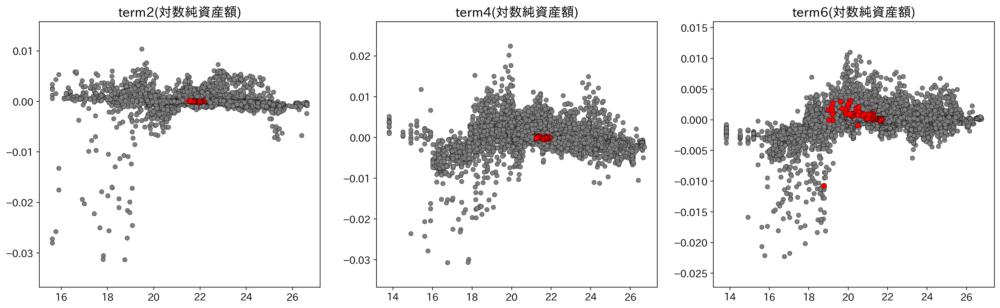

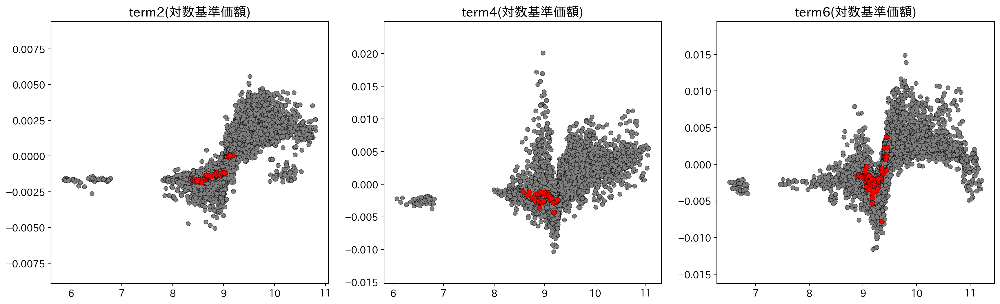

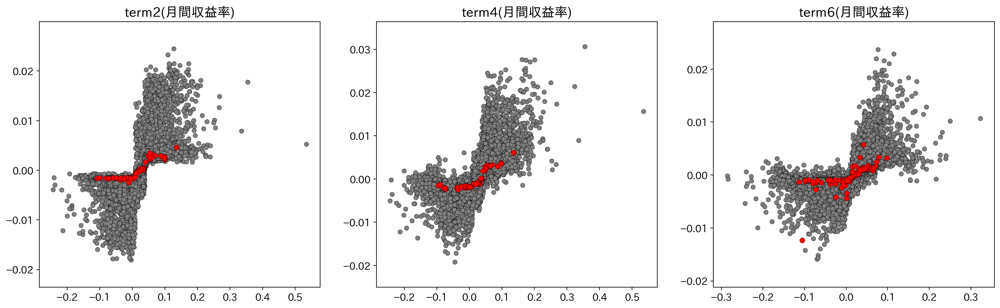

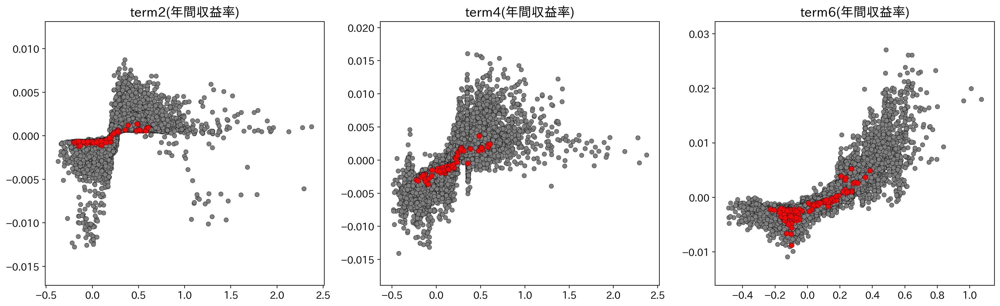

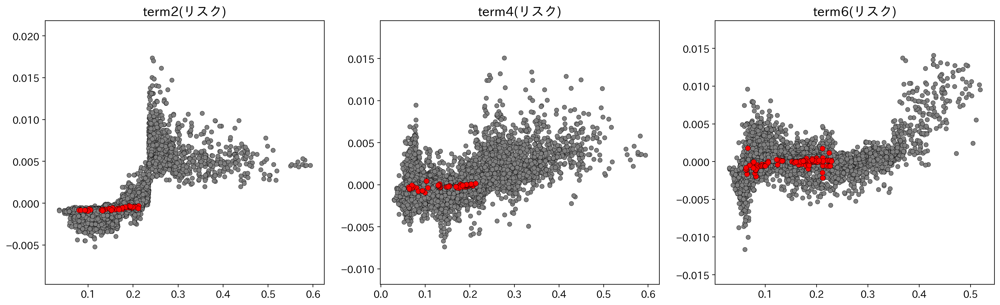

...

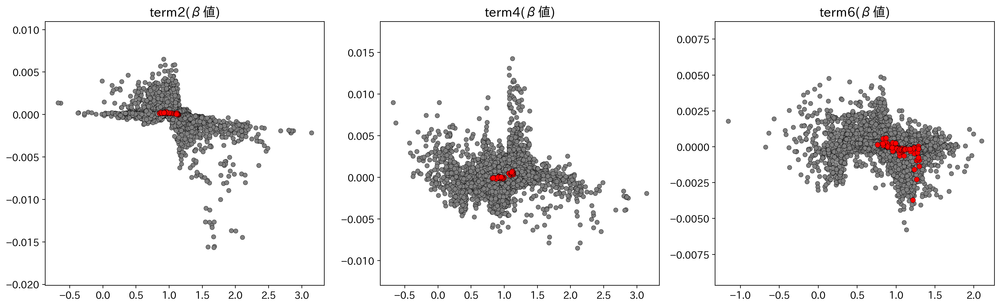

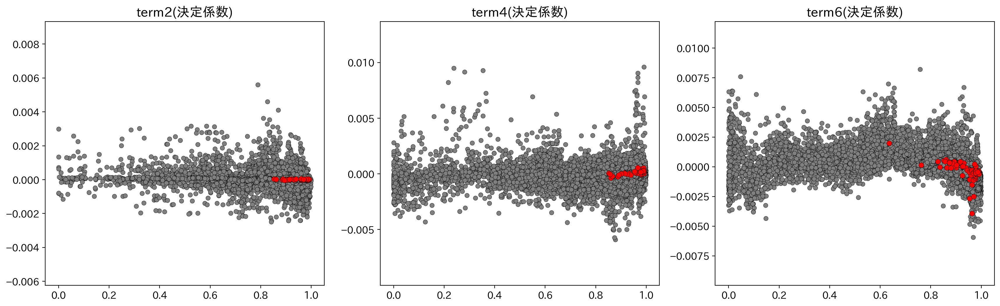

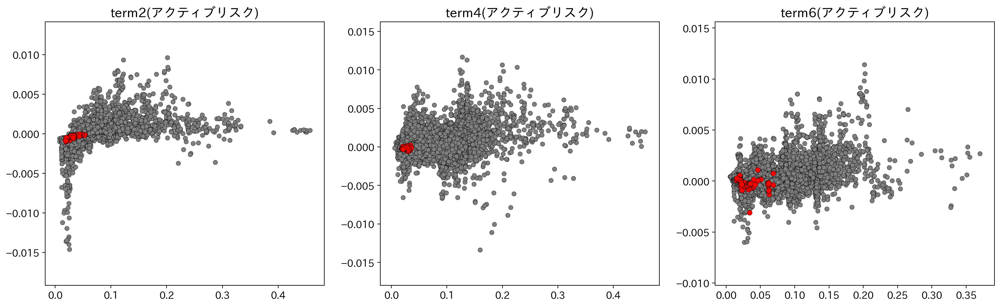

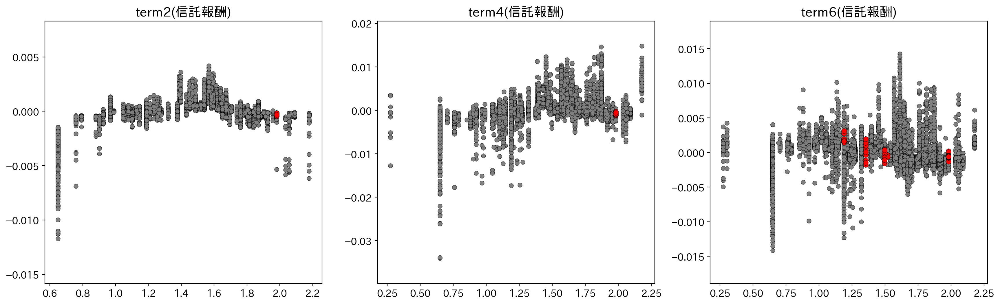

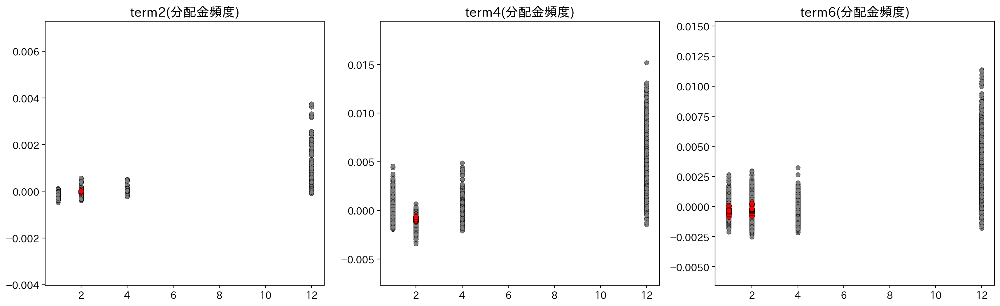

In [30]:
for factor in range(2,len(Buy_term2.columns)):
    compare_Buy_term(factor) 

In [38]:
def compare_Sell_term(X):

    plt.rcParams["font.size"] = 12
    fig = plt.figure(figsize=(21, 6),dpi=200)
    
    ax1 = fig.add_subplot(1,3,1)
    plt.scatter(Sell_term2.iloc[:,X],Sell_sv_term2.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
    plt.scatter(target_Sell_term2.iloc[:,X],target_Sell_sv_term2.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
    plt.title("term2("+(Sell_term2.columns[X]+")"),x=0.5,fontsize=16)

    
    ax2 = fig.add_subplot(1,3,2)
    plt.scatter(Sell_term4.iloc[:,X],Sell_sv_term4.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
    plt.scatter(target_Sell_term4.iloc[:,X],target_Sell_sv_term4.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
    plt.title("term4("+(Sell_term4.columns[X]+")"),x=0.5,fontsize=16)
    
    ax3 = fig.add_subplot(1,3,3)
    plt.scatter(Sell_term6.iloc[:,X],Sell_sv_term6.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
    plt.scatter(target_Sell_term6.iloc[:,X],target_Sell_sv_term6.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
    plt.title("term6("+(Sell_term6.columns[X]+")"),x=0.5,fontsize=16)

## 資金流入（購入）

### 対数経過年数

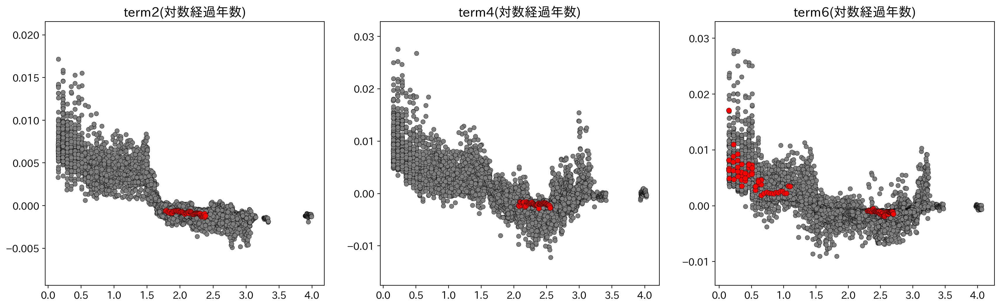

In [39]:
factor_name = "対数経過年数"
factor = Buy_term2.columns.get_loc(factor_name)
compare_Buy_term(factor)

### 年間収益率

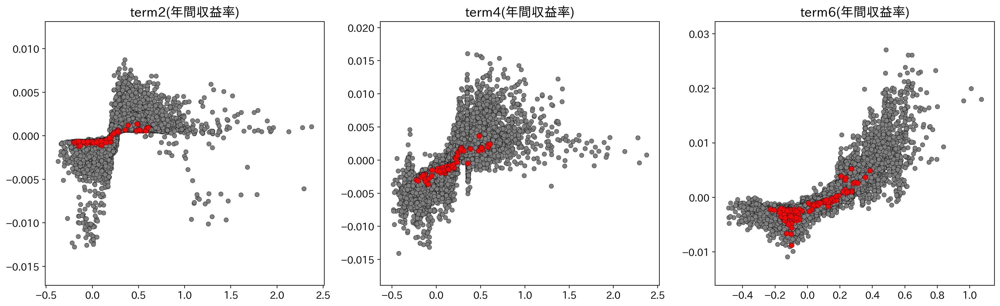

In [33]:
factor_name = "年間収益率"
factor = Buy_term2.columns.get_loc(factor_name)
compare_Buy_term(factor)

### α値

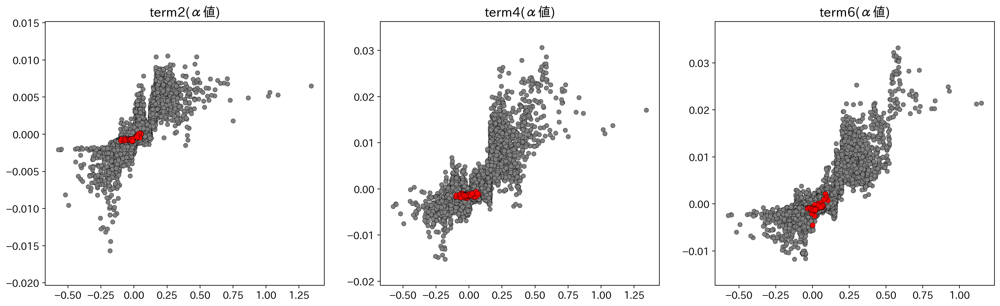

In [34]:
factor_name = "α値"
factor = Buy_term2.columns.get_loc(factor_name)
compare_Buy_term(factor)

### 対数経過年数(目盛り調整済み)

([<matplotlib.axis.YTick at 0x7f87f2c29240>,
 <a list of 5 Text yticklabel objects>)

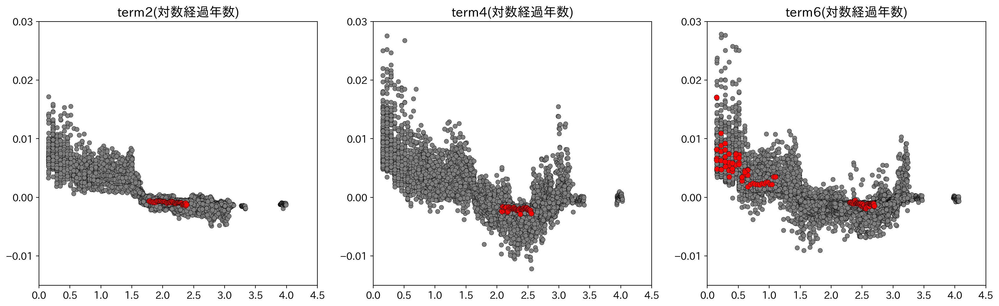

In [48]:
factor_name = "対数経過年数"
X = Buy_term2.columns.get_loc(factor_name)

plt.rcParams["font.size"] = 12
fig = plt.figure(figsize=(21, 6),dpi=200)

ax1 = fig.add_subplot(1,3,1)
plt.scatter(Buy_term2.iloc[:,X],Buy_sv_term2.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Buy_term2.iloc[:,X],target_Buy_sv_term2.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term2("+(Buy_term2.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(0,4.5)
plt.ylim(-0.015,0.03)
plt.yticks(np.arange(-0.01, 0.04, 0.01))
    
ax2 = fig.add_subplot(1,3,2)
plt.scatter(Buy_term4.iloc[:,X],Buy_sv_term4.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Buy_term4.iloc[:,X],target_Buy_sv_term4.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term4("+(Buy_term4.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(0,4.5)
plt.ylim(-0.015,0.03)
plt.yticks(np.arange(-0.01, 0.04, 0.01))
    
    
ax3 = fig.add_subplot(1,3,3)
plt.scatter(Buy_term6.iloc[:,X],Buy_sv_term6.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Buy_term6.iloc[:,X],target_Buy_sv_term6.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term6("+(Buy_term6.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(0,4.5)
plt.ylim(-0.015,0.03)
plt.yticks(np.arange(-0.01, 0.04, 0.01))

### 年間収益率(目盛り調整済み)

([<matplotlib.axis.YTick at 0x7f87f9731a20>,
 <a list of 4 Text yticklabel objects>)

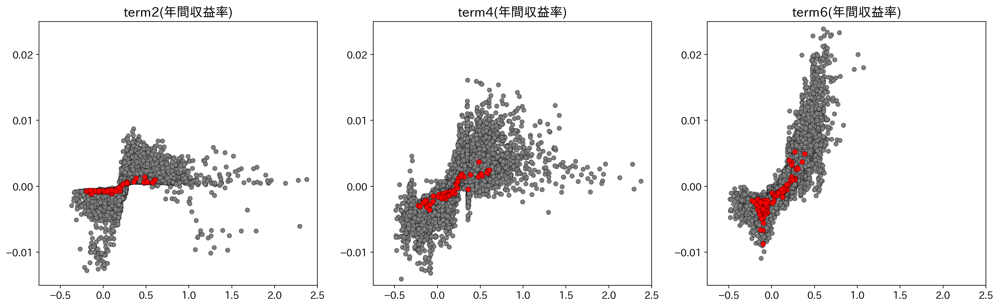

In [56]:
factor_name = "年間収益率"
X = Buy_term2.columns.get_loc(factor_name)

plt.rcParams["font.size"] = 12
fig = plt.figure(figsize=(21, 6),dpi=200)

ax1 = fig.add_subplot(1,3,1)
plt.scatter(Buy_term2.iloc[:,X],Buy_sv_term2.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Buy_term2.iloc[:,X],target_Buy_sv_term2.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term2("+(Buy_term2.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(-0.75,2.5)
plt.ylim(-0.015,0.025)
plt.xticks(np.arange(-0.5, 3.0, 0.5))
plt.yticks(np.arange(-0.010, 0.030, 0.010))
    
ax2 = fig.add_subplot(1,3,2)
plt.scatter(Buy_term4.iloc[:,X],Buy_sv_term4.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Buy_term4.iloc[:,X],target_Buy_sv_term4.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term4("+(Buy_term4.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(-0.75,2.5)
plt.ylim(-0.015,0.025)
plt.xticks(np.arange(-0.5, 3.0, 0.5))
plt.yticks(np.arange(-0.010, 0.030, 0.010))
    
    
ax3 = fig.add_subplot(1,3,3)
plt.scatter(Buy_term6.iloc[:,X],Buy_sv_term6.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Buy_term6.iloc[:,X],target_Buy_sv_term6.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term6("+(Buy_term6.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(-0.75,2.5)
plt.ylim(-0.015,0.025)
plt.xticks(np.arange(-0.5, 3.0, 0.5))
plt.yticks(np.arange(-0.010, 0.030, 0.010))

### α値(目盛り調整済み)

([<matplotlib.axis.YTick at 0x7f8814e25400>,
 <a list of 6 Text yticklabel objects>)

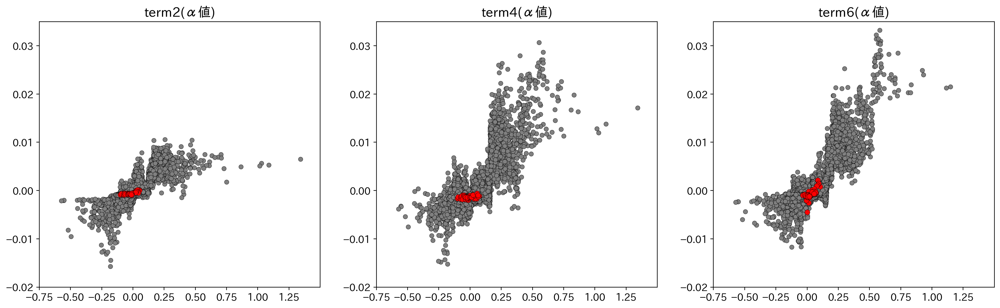

In [52]:
factor_name = "α値"
X = Buy_term2.columns.get_loc(factor_name)

plt.rcParams["font.size"] = 12
fig = plt.figure(figsize=(21, 6),dpi=200)

ax1 = fig.add_subplot(1,3,1)
plt.scatter(Buy_term2.iloc[:,X],Buy_sv_term2.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Buy_term2.iloc[:,X],target_Buy_sv_term2.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term2("+(Buy_term2.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(-0.10,1.5)
plt.ylim(-0.02,0.035)
plt.xticks(np.arange(-0.75, 1.5, 0.25))
plt.yticks(np.arange(-0.02, 0.04, 0.01))
    
ax2 = fig.add_subplot(1,3,2)
plt.scatter(Buy_term4.iloc[:,X],Buy_sv_term4.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Buy_term4.iloc[:,X],target_Buy_sv_term4.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term4("+(Buy_term4.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(-0.10,1.5)
plt.ylim(-0.02,0.035)
plt.xticks(np.arange(-0.75, 1.5, 0.25))
plt.yticks(np.arange(-0.02, 0.04, 0.01))
    
    
ax3 = fig.add_subplot(1,3,3)
plt.scatter(Buy_term6.iloc[:,X],Buy_sv_term6.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Buy_term6.iloc[:,X],target_Buy_sv_term6.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term6("+(Buy_term6.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(-0.10,1.5)
plt.ylim(-0.02,0.035)
plt.xticks(np.arange(-0.75, 1.5, 0.25))
plt.yticks(np.arange(-0.02, 0.04, 0.01))

## 資金流出（解約）

### 対数経過年数(目盛り調整済み)

([<matplotlib.axis.YTick at 0x7f90e2129ac8>,
 <a list of 5 Text yticklabel objects>)

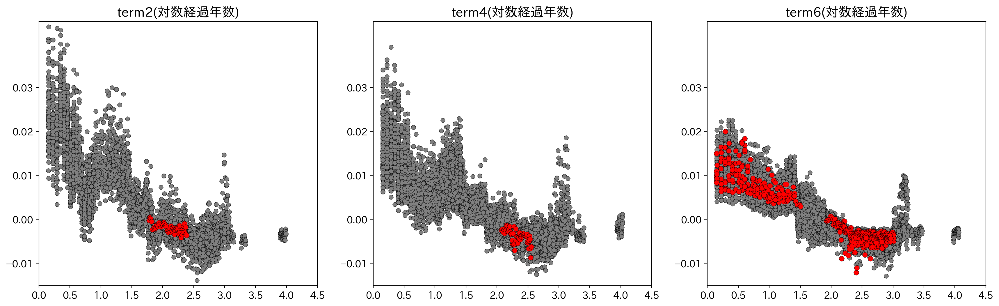

In [8]:
factor_name = "対数経過年数"
X = Sell_term2.columns.get_loc(factor_name)

plt.rcParams["font.size"] = 12
fig = plt.figure(figsize=(21, 6),dpi=200)
    
ax1 = fig.add_subplot(1,3,1)
plt.scatter(Sell_term2.iloc[:,X],Sell_sv_term2.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Sell_term2.iloc[:,X],target_Sell_sv_term2.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term2("+(Sell_term2.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(0,4.5)
plt.ylim(-0.015,0.045)
plt.yticks(np.arange(-0.01, 0.04, 0.01))

    
ax2 = fig.add_subplot(1,3,2)
plt.scatter(Sell_term4.iloc[:,X],Sell_sv_term4.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Sell_term4.iloc[:,X],target_Sell_sv_term4.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term4("+(Sell_term4.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(0,4.5)
plt.ylim(-0.015,0.045)
plt.yticks(np.arange(-0.01, 0.04, 0.01))

    
ax3 = fig.add_subplot(1,3,3)
plt.scatter(Sell_term6.iloc[:,X],Sell_sv_term6.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Sell_term6.iloc[:,X],target_Sell_sv_term6.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term6("+(Sell_term6.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(0,4.5)
plt.ylim(-0.015,0.045)
plt.yticks(np.arange(-0.01, 0.04, 0.01))

### 対数経過年数(目盛り調整済み)

([<matplotlib.axis.YTick at 0x7f90e2266550>,
 <a list of 4 Text yticklabel objects>)

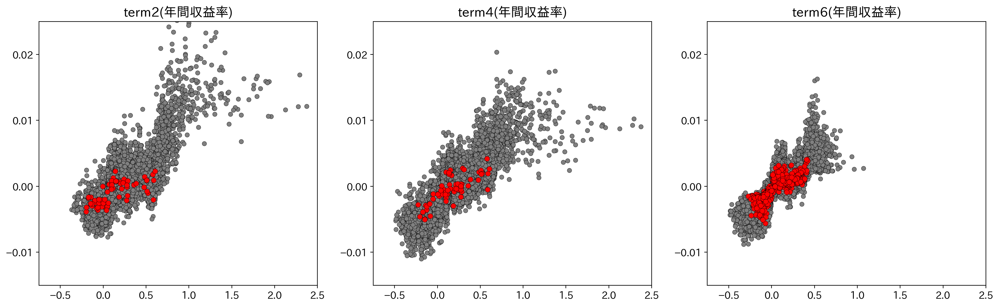

In [9]:
factor_name = "年間収益率"
X = Sell_term2.columns.get_loc(factor_name)

plt.rcParams["font.size"] = 12
fig = plt.figure(figsize=(21, 6),dpi=200)
    
ax1 = fig.add_subplot(1,3,1)
plt.scatter(Sell_term2.iloc[:,X],Sell_sv_term2.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Sell_term2.iloc[:,X],target_Sell_sv_term2.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term2("+(Sell_term2.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(-0.75,2.5)
plt.ylim(-0.015,0.025)
plt.xticks(np.arange(-0.5, 3.0, 0.5))
plt.yticks(np.arange(-0.010, 0.030, 0.010))

    
ax2 = fig.add_subplot(1,3,2)
plt.scatter(Sell_term4.iloc[:,X],Sell_sv_term4.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Sell_term4.iloc[:,X],target_Sell_sv_term4.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term4("+(Sell_term4.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(-0.75,2.5)
plt.ylim(-0.015,0.025)
plt.xticks(np.arange(-0.5, 3.0, 0.5))
plt.yticks(np.arange(-0.010, 0.030, 0.010))

    
ax3 = fig.add_subplot(1,3,3)
plt.scatter(Sell_term6.iloc[:,X],Sell_sv_term6.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Sell_term6.iloc[:,X],target_Sell_sv_term6.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term6("+(Sell_term6.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(-0.75,2.5)
plt.ylim(-0.015,0.025)
plt.xticks(np.arange(-0.5, 3.0, 0.5))
plt.yticks(np.arange(-0.010, 0.030, 0.010))

### α値(目盛り調整済み)

([<matplotlib.axis.YTick at 0x7f90ca41e4e0>,
 <a list of 6 Text yticklabel objects>)

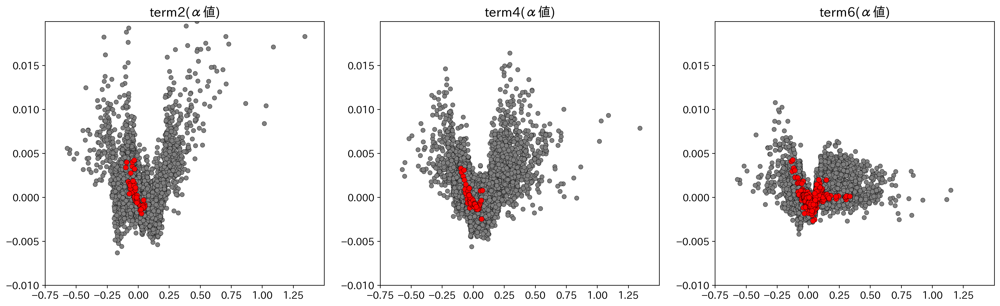

In [11]:
factor_name = "α値"
X = Sell_term2.columns.get_loc(factor_name)

plt.rcParams["font.size"] = 12
fig = plt.figure(figsize=(21, 6),dpi=200)
    
ax1 = fig.add_subplot(1,3,1)
plt.scatter(Sell_term2.iloc[:,X],Sell_sv_term2.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Sell_term2.iloc[:,X],target_Sell_sv_term2.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term2("+(Sell_term2.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(-0.10,1.5)
plt.ylim(-0.01,0.020)
plt.xticks(np.arange(-0.75, 1.5, 0.25))
plt.yticks(np.arange(-0.010, 0.020, 0.005))

    
ax2 = fig.add_subplot(1,3,2)
plt.scatter(Sell_term4.iloc[:,X],Sell_sv_term4.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Sell_term4.iloc[:,X],target_Sell_sv_term4.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term4("+(Sell_term4.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(-0.10,1.5)
plt.ylim(-0.01,0.020)
plt.xticks(np.arange(-0.75, 1.5, 0.25))
plt.yticks(np.arange(-0.010, 0.020, 0.005))
    
ax3 = fig.add_subplot(1,3,3)
plt.scatter(Sell_term6.iloc[:,X],Sell_sv_term6.iloc[:,X],s=30, c='gray',linewidths=0.3, edgecolors='black')
plt.scatter(target_Sell_term6.iloc[:,X],target_Sell_sv_term6.iloc[:,X],s=40, c='red',linewidths=0.3, edgecolors='black')
plt.title("term6("+(Sell_term6.columns[X]+")"),x=0.5,fontsize=16)
plt.xlim(-0.10,1.5)
plt.ylim(-0.01,0.020)
plt.xticks(np.arange(-0.75, 1.5, 0.25))
plt.yticks(np.arange(-0.010, 0.020, 0.005))